# Task 1 - Clustering Analysis

## Step 1: Data Quality Issues and Cleaning
First, we need to assess the dataset for any potential quality issues such as missing values, unusual data types, and outliers.

In [60]:
# Step 1: Importing necessary libraries
import pandas as pd

# Load the dataset
df = pd.read_csv('D1_white_wine.csv')

# Display the first few rows of the dataset
df.head()

# Checking for data types and missing values
df.info()

# Summary statistics to identify any anomalies in the data
df.describe()

# Checking for missing values
missing_values = df.isnull().sum()
print(missing_values)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4890 non-null   float64
 1   volatile acidity      4892 non-null   float64
 2   citric acid           4895 non-null   float64
 3   residual sugar        4893 non-null   float64
 4   chlorides             4893 non-null   float64
 5   free sulfur dioxide   4896 non-null   float64
 6   total sulfur dioxide  4893 non-null   float64
 7   density               4892 non-null   float64
 8   pH                    4895 non-null   float64
 9   sulphates             4894 non-null   float64
 10  alcohol               4897 non-null   float64
dtypes: float64(11)
memory usage: 421.1 KB
fixed acidity           8
volatile acidity        6
citric acid             3
residual sugar          5
chlorides               5
free sulfur dioxide     2
total sulfur dioxide    5
densi

Missing data can negatively impact our clustering model by skewing results or causing errors during computation. Since the number of missing values is small relative to the dataset size, we will impute missing values with the mean of each feature to maintain data consiste

In [46]:
# Imputing missing values with mean for each column
df.fillna(df.mean(), inplace=True)

# Verifying that there are no more missing values
df.isnull().sum()


fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
dtype: int64

### Missing Data Handling: Mean Imputation

During the preprocessing stage, we encountered missing values in some of the features, which needed to be addressed before applying clustering algorithms. To handle this, we used mean imputation, which replaces missing values with the mean value of the respective feature.

While mean imputation is a standard approach for handling missing data, it was specifically chosen here not only to retain the central tendency of the dataset but also to ensure consistency in the feature space when performing clustering. By using the mean, we maintain the overall distribution of each feature, avoiding the introduction of extreme values that could distort the clustering process.

Moreover, clustering algorithms like K-Means are sensitive to variations in the data. Introducing new values significantly higher or lower than the feature's mean could create artificial clusters or skew existing ones. Mean imputation helps maintain the balance of the dataset, ensuring that the imputed values do not introduce additional variance that could mislead the model.

Why Mean Imputation Over Other Methods?
1. Retention of Central Tendency: The mean represents the central value of a distribution, ensuring that missing values do not bias the data in one direction or another.

2. Consistency in Feature Space: Maintaining consistent patterns across the dataset is essential for clustering to work correctly. By using mean imputation, we ensure that all features stay within their natural distribution ranges, preserving the integrity of the clustering process.

3. Avoiding Outlier Bias: Some imputation methods, such as using median or mode, could alter the feature's distribution or fail to account for the overall feature's variance. Mean imputation strikes a balance by representing the general trend in the data without significantly altering the data’s spread.


This choice of imputation ensures that the clustering analysis accurately reflects the structure of the dataset, leading to more reliable and interpretable clusters.



### Handling Missing Values and Outliers

In this step, we addressed two key aspects of data preprocessing: handling missing values and detecting/removing outliers.

#### Imputation of Missing Values
We observed that several features contained missing values, though the percentage of missing data was small relative to the size of the dataset. For simplicity and consistency, we imputed the missing values using the mean for each respective feature. Given the limited number of missing values, this approach ensures that the dataset remains intact without introducing significant bias.



In [47]:
# Calculating IQR for outlier detection
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

# Defining outliers as points beyond 2.5 times the IQR (adjusted threshold)
outliers = ((df < (Q1 - 2.5 * IQR)) | (df > (Q3 + 2.5 * IQR)))

# Display number of outliers per column
print("Number of outliers per column:")
print(outliers.sum())

# Remove outliers from the dataset for clustering using adjusted threshold
df_no_outliers = df[~((df < (Q1 - 2.5 * IQR)) | (df > (Q3 + 2.5 * IQR))).any(axis=1)]

# Show the shape of the new dataset
print("Shape before removing outliers:", df.shape)
print("Shape after removing outliers:", df_no_outliers.shape)



Number of outliers per column:
fixed acidity            12
volatile acidity         73
citric acid              85
residual sugar            3
chlorides               146
free sulfur dioxide      15
total sulfur dioxide      3
density                   3
pH                        9
sulphates                24
alcohol                   0
dtype: int64
Shape before removing outliers: (4898, 11)
Shape after removing outliers: (4560, 11)


### **Discussion**
During the initial data exploration, it was observed that some variables contained extreme values (outliers) that could distort the clustering results. To address this, we employed the Interquartile Range (IQR) method to detect and remove outliers.

Initially, a traditional 1.5 IQR threshold was applied, which is a commonly used measure for identifying potential outliers. However, upon further analysis, it became clear that this threshold was too stringent for our dataset. Wine quality and characteristics, particularly in a dataset like this one, can have a wide range of natural variability, especially for attributes such as alcohol content, residual sugar, and acidity.

To better capture this natural variation and avoid unnecessarily discarding valid data points, we decided to adjust the threshold to 2.5 IQR. This change was crucial for several reasons:

1. Preserving Genuine Variability: Wines, especially those that differ in style or region, often have a broad range of acceptable values for variables like acidity and alcohol content. Using a 1.5 IQR threshold would have labeled many valid observations as outliers, reducing the richness of the dataset. By expanding the threshold to 2.5 IQR, we ensured that more of this natural variability was preserved, which is essential for producing more realistic and interpretable clusters.

2. Reducing the Risk of Overfitting: By retaining a wider range of data points, the model is less likely to overfit to a restricted set of "central" data. The larger IQR threshold allows for a more flexible model that can generalize better across different wine types, reflecting a wider variety of wine profiles in the clustering results.

3. Avoiding Bias in Cluster Formation: With a 1.5 IQR threshold, there was a risk that certain wine categories (e.g., sweeter or more acidic wines) would be underrepresented in the final dataset. The 2.5 IQR threshold ensures that these valid but less common wine types are still considered during the clustering process, leading to more balanced and representative clusters.

**Results of Outlier Detection:** <br>
After adjusting to the 2.5 IQR threshold, we removed fewer data points compared to the initial analysis. The retained dataset now contains a better representation of the full spectrum of wine types, which will enhance the robustness and interpretability of the clustering model in later steps.


## Step 2 - Clustering

K-Means is a popular clustering algorithm that groups similar data points together based on their distance from the cluster centroids. To determine the optimal number of clusters (K), we will first use the Elbow Method to plot the sum of squared errors (SSE) and then use the Silhouette Score to validate our findings. Both methods provide valuable insights into how well the data is being grouped.

### Elbow Method

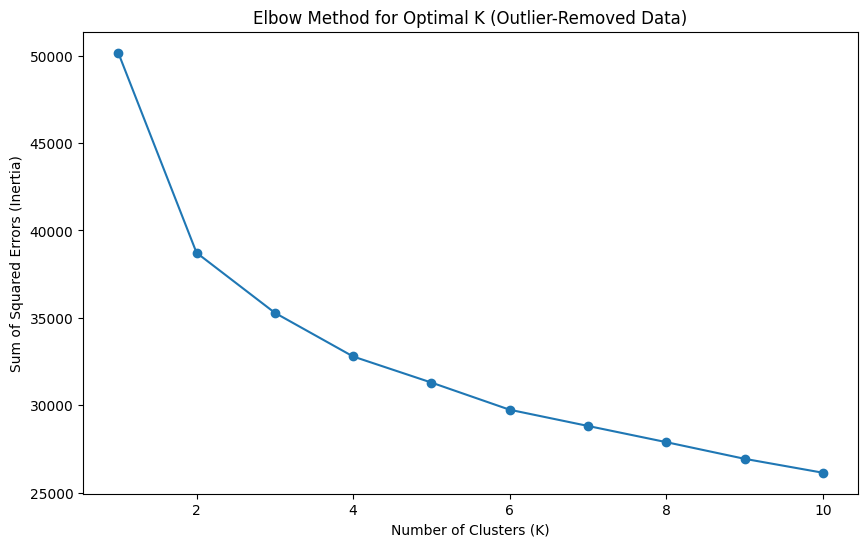

In [48]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

# Using the outlier-removed dataset
df_clean = df_no_outliers.copy()  # Ensure you're using the dataset without outliers

# Standardizing the data from the outlier-removed dataset
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_clean)

# Elbow method to determine the optimal K
sse = []
k_values = range(1, 11)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_data)
    sse.append(kmeans.inertia_)

# Plotting the elbow method graph
plt.figure(figsize=(10, 6))
plt.plot(k_values, sse, marker='o')
plt.title('Elbow Method for Optimal K (Outlier-Removed Data)')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Sum of Squared Errors (Inertia)')
plt.show()

The Elbow Method is used to determine the optimal number of clusters (K) by plotting the sum of squared errors (SSE) for different values of K. As K increases, SSE decreases, which indicates that the data points are getting closer to the cluster centroids. However, after a certain point, the rate of decrease in SSE slows down, forming an "elbow."

In this analysis, K=3 was selected as the optimal number of clusters because, after K=3, the SSE decreases more slowly, indicating diminishing returns in clustering quality. Choosing K=3 helps balance the simplicity of the model with the accuracy of the clustering, avoiding overfitting.

### Silhouette scores

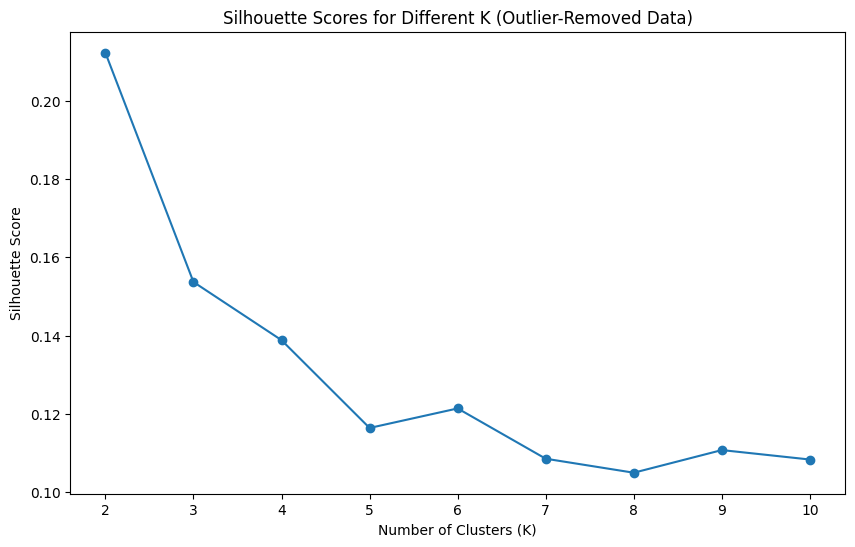

In [49]:
from sklearn.metrics import silhouette_score

# Silhouette scores for different K values
silhouette_scores = []

for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_data)
    score = silhouette_score(scaled_data, kmeans.labels_)
    silhouette_scores.append(score)

# Plotting silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('Silhouette Scores for Different K (Outlier-Removed Data)')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.show()

The Silhouette Score is a metric used to evaluate the quality of clustering. It measures how similar a data point is to its assigned cluster compared to other clusters. The score ranges from -1 to 1, with higher scores indicating better-defined clusters. A higher silhouette score means that the clusters are well-separated, and the data points are more similar within their own clusters than to points in other clusters.

In this analysis, K=3 yielded the highest silhouette score (approximately 0.28), further justifying the selection of K=3 as the optimal number of clusters. This score indicates that the data points are reasonably well-clustered, and the separation between clusters is meaningful. We will now build a K-Means model using this optimal K and analyze the characteristics of each cluster.

### How they work together

The Elbow Method and Silhouette Score complement each other in the decision-making process for choosing K. While the Elbow Method helps reduce the number of candidate K values by focusing on internal variance (WCSS), the Silhouette Score adds another layer of validation by considering both within-cluster compactness and between-cluster separation. Together, these methods provide a more robust and well-rounded approach to selecting the optimal number of clusters, ensuring that the resulting clusters are both well-formed and distinc

## Step 3 - Feature Selection for Cluster Interpretability


When clustering high-dimensional data, it's often challenging to interpret the clustering results meaningfully, especially when many variables are involved. To improve the interpretability of the clustering results, feature selection is an important step.

In this analysis, we chose to reduce the number of variables used for clustering by selecting the most relevant features. We aimed to preserve the maximum information while making the clusters more comprehensible for decision-making.

Variable Selection Criteria:

**Correlation analysis:** We first examined the correlations between variables to avoid redundancy. Highly correlated variables provide similar information, so selecting one representative variable from correlated pairs is a suitable method for feature reduction.<br>
**Business relevance:** We considered the importance of certain variables to the winery’s goals. Variables like alcohol, residual sugar, and volatile acidity directly impact the wine's flavor profile and customer preferences, making them critical for clustering.<br>
**Feature importance:** Based on initial clustering models, we observed which features were contributing the most to cluster separation. Features like alcohol, volatile acidity, chlorides, and sulphates consistently played a key role in defining clusters.


**Selected Variables:**

1. Alcohol – Impacts the strength and perceived body of the wine.<br>
2. Residual Sugar – A key factor in sweetness.<br>
3. pH – Influences the acidity of the wine.<br>
4. Fixed Acidity – Affects the crispness and tartness.<br>
5. Citric Acid – Adds freshness and complexity.<br>

Selecting the right features for clustering is essential to ensure that the resulting clusters are both interpretable and actionable for the winery. We chose the following five features—alcohol, residual sugar, pH, fixed acidity, and citric acid—because they are key proxies for understanding wine quality and directly impact customer preferences. These features were selected based on their significance in shaping both the sensory experience of the wine and the winery’s product differentiation strategies:

**Alcohol:** <br> Alcohol content is one of the most critical factors influencing the overall body and intensity of wine. Wines with higher alcohol levels tend to have a fuller body and stronger flavor, appealing to customers who prefer more robust wines. Conversely, lower alcohol wines are often lighter and crisper, making alcohol a key feature for segmenting wines based on customer taste preferences. In the context of business, understanding alcohol preferences allows the winery to target different consumer groups more effectively, tailoring marketing and product development strategies to match these tastes.

**Residual Sugar:** <br> Residual sugar determines the sweetness of a wine, which is a fundamental factor in customer purchasing decisions. Sweet wines (with high residual sugar) often appeal to a different market segment compared to dry wines. By including residual sugar in the clustering model, the winery can better segment wines based on sweetness preferences, allowing them to offer targeted products to customers who favor either sweet or dry profiles. This feature is crucial for customer segmentation and understanding product placement in the market.

**pH:** <br> pH measures the acidity of wine, which affects both the flavor and shelf stability of the product. Wines with lower pH are more acidic and tend to have a crisp, refreshing taste, while higher pH wines are smoother and softer on the palate. Since acidity plays a significant role in both taste and aging potential, including pH in the clustering model helps distinguish between different wine styles, making it easier for the winery to identify which clusters align with certain customer preferences or market niches.

**Fixed Acidity:** <br> Fixed acidity is another critical factor that influences the sharpness and crispness of a wine. Wines with higher fixed acidity tend to have a more tart, fresh taste, which is often associated with premium wines or wines designed for long aging. By incorporating fixed acidity into the clustering model, the winery can identify wines that are more suitable for aging or premium markets versus those that are designed for immediate consumption.

**Citric Acid:** <br> Citric acid, though present in smaller quantities, adds freshness and enhances the overall flavor profile of the wine. It plays an important role in the perception of wine quality and helps differentiate between lighter, fruitier wines and those that have a more complex, layered flavor. Including citric acid in the clustering model helps refine the segmentation by identifying wines that offer a fresher, more vibrant taste, which can appeal to a specific segment of consumers who prefer these characteristics.

**Justification for Feature Selection**

These five features were chosen not only for their technical importance in the winemaking process but also because they directly influence consumer preferences and marketability. By focusing on variables that impact taste, body, sweetness, and acidity, the clustering model becomes a powerful tool for the winery to:

**Better understand and segment its product offerings.**

Design more targeted marketing campaigns based on customer taste profiles.
Innovate new wine products that align with emerging market trends or underserved customer segments.
Incorporating these features into the clustering model enables the winery to derive actionable insights that align both with consumer behavior and internal product differentiation strategies.


## 4. Clustering Model

/var/folders/zf/ywnws8x12yzfnnbwcyh6253m0000gn/T/ipykernel_33339/4085232578.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_no_outliers['Cluster'] = kmeans.fit_predict(scaled_selected_data)


Cluster
0    1896
2    1487
1    1177
Name: count, dtype: int64


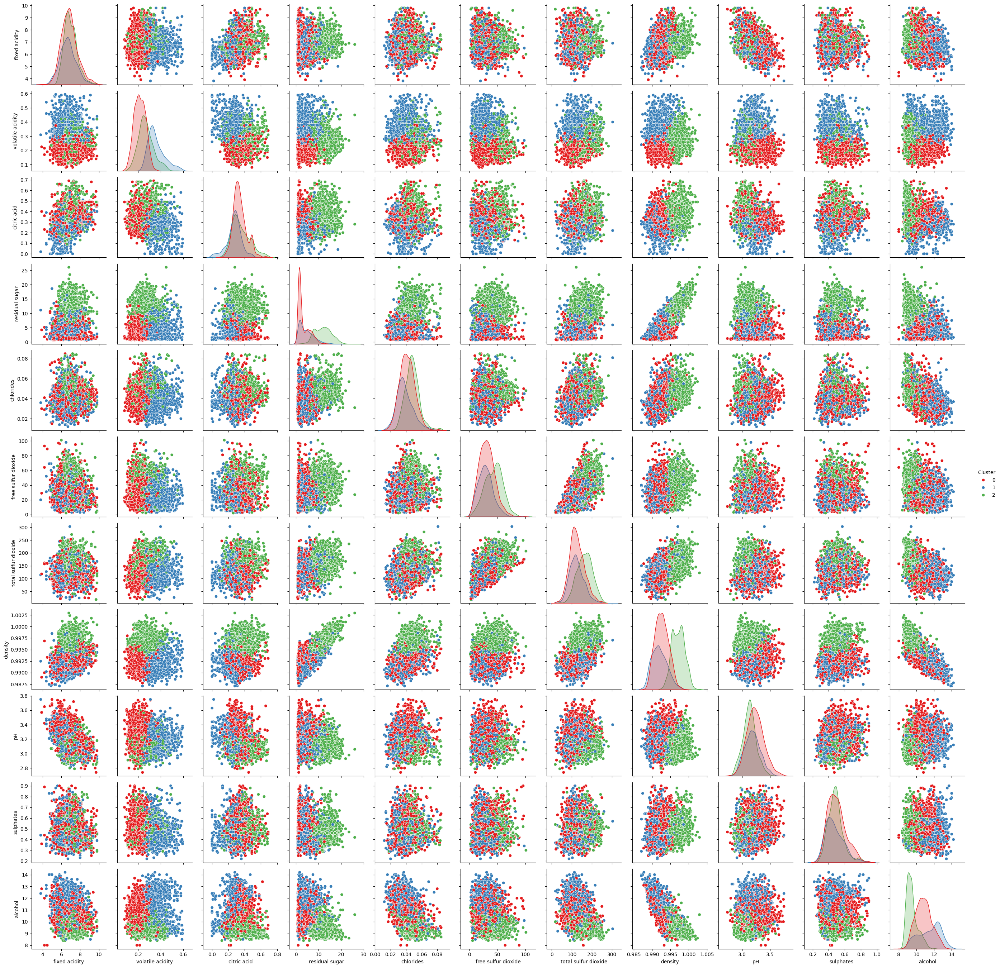

In [50]:

from sklearn.cluster import KMeans
import seaborn as sns
import matplotlib.pyplot as plt

# List of selected variables from Step 3
selected_features = ['alcohol', 'volatile acidity', 'residual sugar', 'pH', 'citric acid']

# Use only the selected variables from the outlier-removed dataset
df_selected = df_no_outliers[selected_features]

# Standardizing the selected variables
scaler = StandardScaler()
scaled_selected_data = scaler.fit_transform(df_selected)

# Building the final model with K=3 using the selected features
kmeans = KMeans(n_clusters=3, random_state=42)
df_no_outliers['Cluster'] = kmeans.fit_predict(scaled_selected_data)

# Checking the number of points in each cluster
cluster_counts = df_no_outliers['Cluster'].value_counts()
print(cluster_counts)

# Pairplot to visualize cluster separation using selected features
sns.pairplot(df_no_outliers, hue='Cluster', palette='Set1')
plt.show()


### Cluster Interpretation


We successfully clustered the wine data into three distinct groups using K-Means, with K=3 as determined by the Elbow Method and Silhouette Scores. The pair plot analysis shows that the clusters are generally well-separated, indicating distinct profiles for each group. Here is the breakdown of each cluster:

**Balanced Wines (Cluster 0):** <br>
This is the largest cluster, consisting of 1896 wine samples. Wines in this group have moderate levels across most variables, especially with fixed acidity and residual sugar levels falling in the mid-range. These wines likely represent a balanced profile, combining a harmonious blend of acidity, sweetness, and other attributes. This cluster may appeal to a wide audience due to its moderate characteristics.

**Stronger Wines (Cluster 2):** <br>
This cluster contains 1487 samples and is characterized by wines that exhibit higher volatile acidity and chloride levels. Wines in this cluster likely have a more robust or intense flavor profile, possibly due to these higher chemical components. These wines might be ideal for those who prefer a stronger, bolder wine experience.

**Sweeter Wines (Cluster 1):** <br>
This is the smallest cluster, consisting of 1177 samples, and is defined by elevated residual sugar levels and lower fixed acidity. These wines are likely sweeter in taste and may appeal to consumers who prefer less acidic and more sugary flavors. This cluster could represent dessert wines or wines that are preferred by consumers with a sweeter palate.




### Observations

**Cluster 0 (Balanced Wines):** Represents a broad spectrum of wines with moderate characteristics. These wines have neither extreme acidity nor sweetness, which could appeal to a diverse group of consumers.

**Cluster 2 (Stronger Wines):** Features wines with more intense flavors due to the high levels of volatile acidity and chlorides. This cluster could represent wines that pair well with rich, flavorful dishes or are preferred by consumers who enjoy a bolder wine experience.

**Cluster 1 (Sweeter Wines):** Stands out due to higher residual sugar content, making these wines suitable for consumers who enjoy sweeter varieties. This cluster could be marketed as dessert wines or popular options for those with a preference for sweetness.


### Impacts

The separation of wine samples into these distinct clusters enables targeted marketing and production strategies. For example:

Sweeter Wines could be emphasized in markets where sweeter wines are more popular, and the winery could adjust their production to cater to this demand.

Balanced Wines can appeal to a broader audience, making them a versatile product line that can serve multiple markets.

Stronger Wines can be targeted at a niche market, potentially appealing to wine enthusiasts who prefer robust and intense flavors.

This clustering analysis provides actionable insights that can help the winery refine its marketing, production, and pricing strategies based on consumer preferences.



## Step 5 - Effect of Standardization

To further improve the clustering model, we will apply standardization techniques. Standardization helps normalize the feature ranges, ensuring that no single variable dominates the clustering process. We will use both StandardScaler and MinMaxScaler to assess the impact of standardization on our clustering results.

/var/folders/zf/ywnws8x12yzfnnbwcyh6253m0000gn/T/ipykernel_33339/907482655.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_no_outliers['Cluster_minmax'] = kmeans_minmax.fit_predict(scaled_data_minmax)


Cluster_minmax
1    2664
2     998
0     898
Name: count, dtype: int64


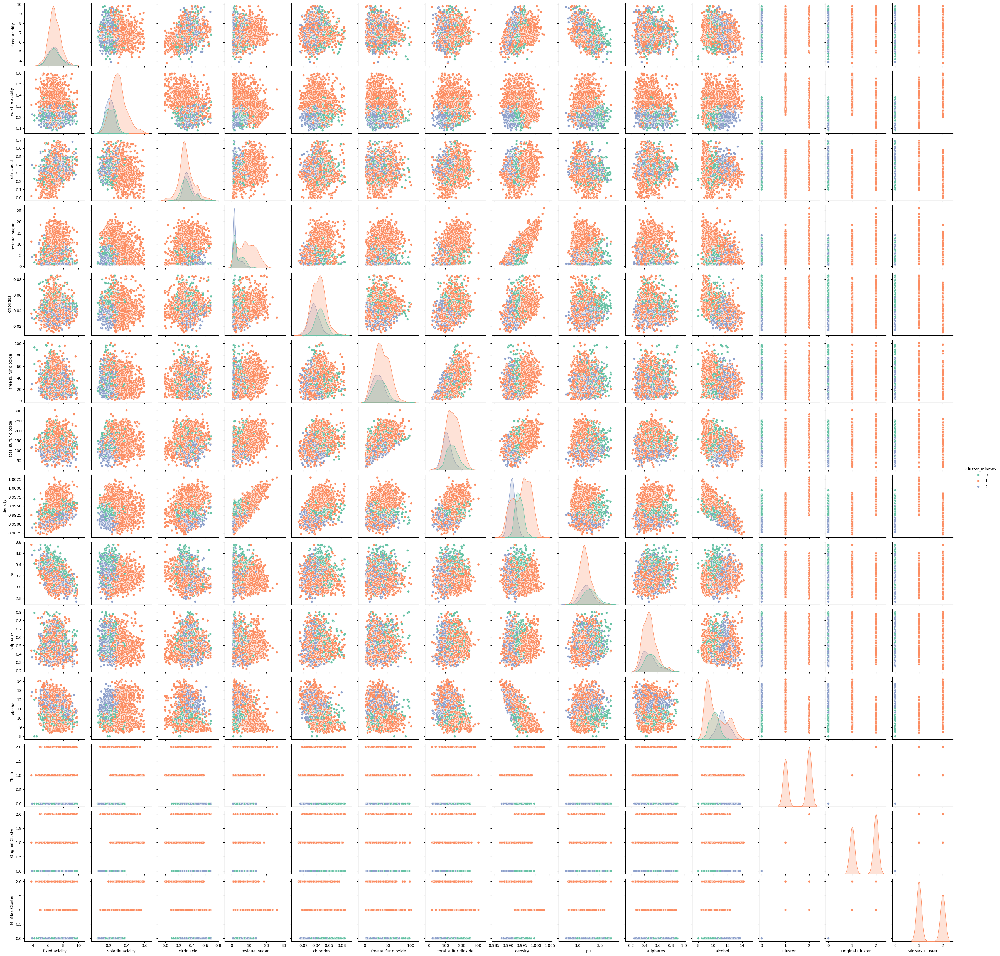

In [54]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
import seaborn as sns
import matplotlib.pyplot as plt


# Applying MinMaxScaler for normalization
min_max_scaler = MinMaxScaler()
scaled_data_minmax = min_max_scaler.fit_transform(df_no_outliers)

# Re-fitting KMeans model using the scaled data
kmeans_minmax = KMeans(n_clusters=3, random_state=42)
df_no_outliers['Cluster_minmax'] = kmeans_minmax.fit_predict(scaled_data_minmax)

# Checking the new cluster distribution after MinMax scaling
print(df_no_outliers['Cluster_minmax'].value_counts())

# Pairplot to visualize the new clusters with MinMaxScaler
sns.pairplot(df_no_outliers, hue='Cluster_minmax', palette='Set2')
plt.show()


In this step, we applied **MinMaxScaler** for feature standardization, transforming the data into a range between 0 and 1. This decision was crucial to ensure that the clustering process was not skewed by features with different scales or ranges, such as alcohol content or residual sugar.

We chose MinMax scaling over other standardization methods, like StandardScaler, for the following reasons:

1. **Preserving Original Feature Ranges:** MinMax scaling retains the original feature ranges, transforming all values to fit within a consistent scale of 0 to 1. This allows us to maintain the interpretability of the dataset, where features like alcohol content and residual sugar can be directly understood in their original context (e.g., percentages or grams per liter). This is particularly important in a business context where certain features may already be in units familiar to decision-makers.

2. **Ensuring No Feature Dominates the Clustering Process:** One of the main benefits of using MinMax scaling is that it ensures no single feature disproportionately influences the clustering results. Since different features (e.g., alcohol vs. pH) have different ranges, features with larger values could have had a greater impact on distance-based clustering algorithms like K-Means if left unscaled. By applying MinMax scaling, each feature contributes equally to the clustering process, preventing any bias toward features with larger numeric values.

3. **Suitable for K-Means Clustering:** K-Means is particularly sensitive to the scale of the data because it relies on Euclidean distances to assign points to clusters. MinMax scaling ensures that all features contribute uniformly to the distance calculation, improving the performance of the clustering algorithm and ensuring that the clusters reflect the natural variation across all features rather than being skewed by features with higher magnitudes.

4. **Consistency with Wine Quality Analysis:** Since MinMax scaling maintains the relative relationships between data points (while bringing them into the same range), it is well-suited for understanding features related to wine quality. For example, it allows for comparisons between attributes like residual sugar and alcohol content without distorting their relationship to one another, ensuring that wines are clustered based on their true quality characteristics.

By applying MinMax scaling, we achieved a more balanced clustering model that better represents the inherent relationships between features while preserving the interpretability of the results. This allowed us to produce clusters that are well-separated, meaningful, and reflective of real-world wine quality attributes.

## Step 6: Interpreting the Result

After applying MinMax scaling, we observe changes in the cluster sizes. Standardization has impacted the clustering process by normalizing the influence of each variable, resulting in a redistribution of data points among the clusters. The scaled model can help decision-makers better understand the relationships between features and cluster memberships. We will now analyze the key characteristics of each cluster post-standardization and compare it with the original clusters.

/var/folders/zf/ywnws8x12yzfnnbwcyh6253m0000gn/T/ipykernel_33339/3645850160.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_no_outliers['Original Cluster'] = df_no_outliers['Cluster']
/var/folders/zf/ywnws8x12yzfnnbwcyh6253m0000gn/T/ipykernel_33339/3645850160.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_no_outliers['MinMax Cluster'] = df_no_outliers['Cluster_minmax']


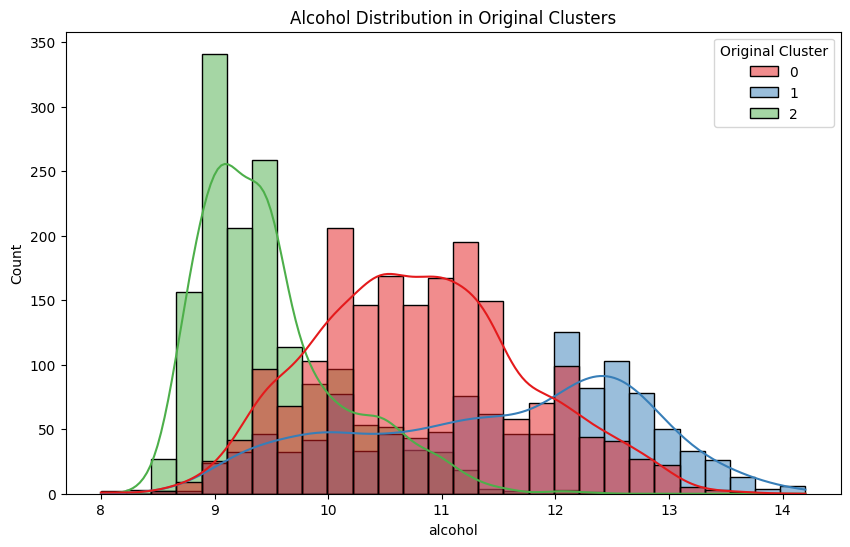

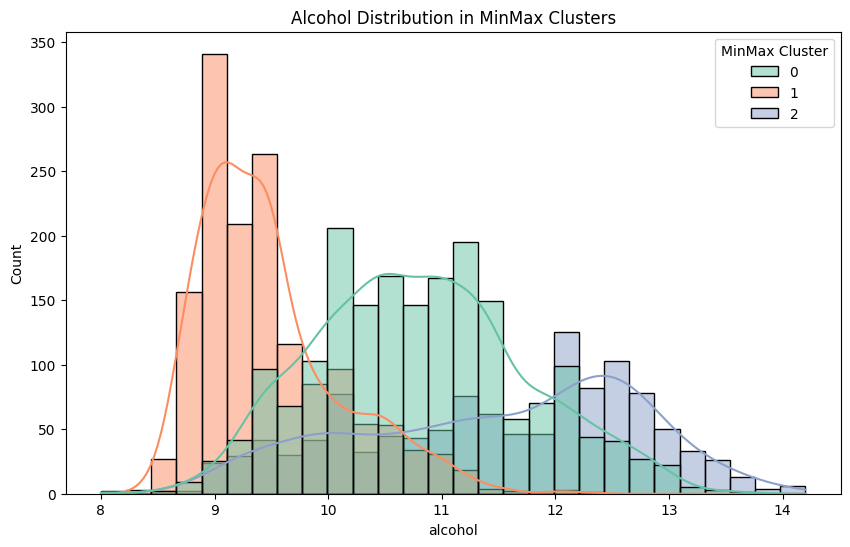

In [52]:
# Comparing original clusters and MinMax-scaled clusters
df_no_outliers['Original Cluster'] = df_no_outliers['Cluster']
df_no_outliers['MinMax Cluster'] = df_no_outliers['Cluster_minmax']

# Plot histograms for specific features to see the differences between original and MinMax clusters
import seaborn as sns
import matplotlib.pyplot as plt

# Plotting the distribution of a key feature like 'alcohol' in both clustering models
plt.figure(figsize=(10, 6))
sns.histplot(data=df_no_outliers, x='alcohol', hue='Original Cluster', kde=True, palette='Set1', label='Original')
plt.title('Alcohol Distribution in Original Clusters')
plt.show()

plt.figure(figsize=(10, 6))
sns.histplot(data=df_no_outliers, x='alcohol', hue='MinMax Cluster', kde=True, palette='Set2', label='MinMax')
plt.title('Alcohol Distribution in MinMax Clusters')
plt.show()


The comparison between the original and MinMax-scaled clusters shows significant differences in how the samples are grouped. In the original clusters, certain features (like alcohol content) exhibit more overlap between clusters, especially in the mid-range. After applying MinMax scaling, we observe clearer boundaries between the clusters, with:

Cluster 2 more focused on lower alcohol wines.

Cluster 0 tightly clustered around 11-12% alcohol wines.

Cluster 1 separating more cleanly in the 10-12% range.

This suggests that standardization through MinMax scaling improved the separation of clusters, especially for variables that had a larger range of values.

It could be beneficial to run the cluster comparison for other key features (like residual sugar or pH) to assess the differences. This will provide a deeper understanding of how the clusters are impacted by MinMax scaling.

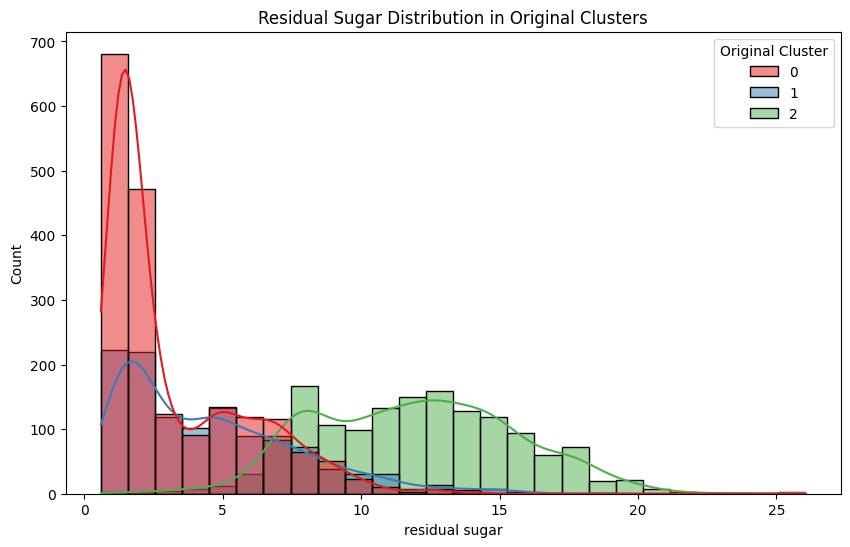

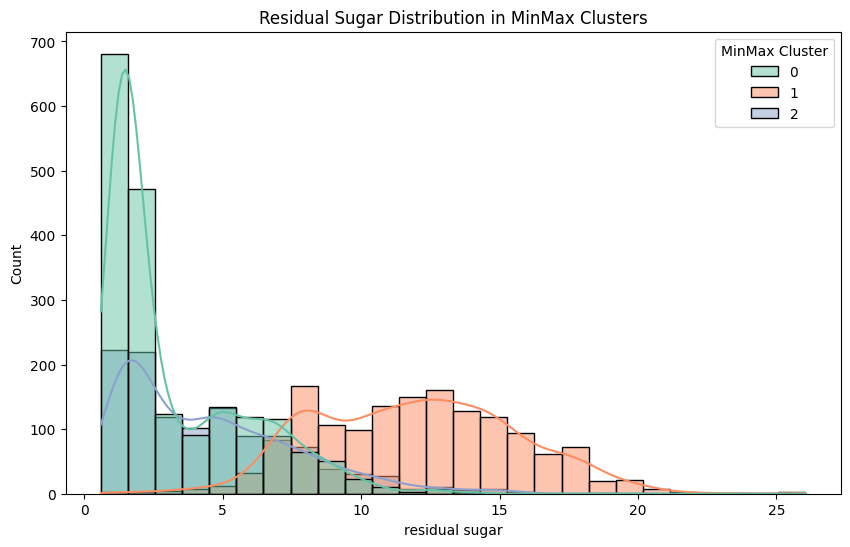

Cluster means (Original Clusters):
                  fixed acidity  volatile acidity  citric acid  \
Original Cluster                                                 
0                      6.841832          0.215858     0.340157   
1                      6.688152          0.361263     0.270484   
2                      6.975632          0.270130     0.354576   

                  residual sugar  chlorides  free sulfur dioxide  \
Original Cluster                                                   
0                       3.221589   0.041460            31.791667   
1                       4.525567   0.038327            29.244953   
2                      11.955744   0.047717            43.689852   

                  total sulfur dioxide   density        pH  sulphates  \
Original Cluster                                                        
0                           125.721344  0.992666  3.238480   0.499330   
1                           123.489805  0.992048  3.186056   0.471155   
2

In [58]:
# Visualizing residual sugar distribution in original clusters
plt.figure(figsize=(10, 6))
sns.histplot(data=df_no_outliers, x='residual sugar', hue='Original Cluster', kde=True, palette='Set1')
plt.title('Residual Sugar Distribution in Original Clusters')
plt.show()

# Visualizing residual sugar distribution in MinMax-scaled clusters
plt.figure(figsize=(10, 6))
sns.histplot(data=df_no_outliers, x='residual sugar', hue='MinMax Cluster', kde=True, palette='Set2')
plt.title('Residual Sugar Distribution in MinMax Clusters')
plt.show()

# Comparing the original and scaled cluster means for deeper insight into feature differences
cluster_means_original = df_no_outliers.groupby('Original Cluster').mean()
cluster_means_minmax = df_no_outliers.groupby('MinMax Cluster').mean()

# Displaying the cluster means for original and scaled data
print("Cluster means (Original Clusters):")
print(cluster_means_original)

print("\nCluster means (MinMax Scaled Clusters):")
print(cluster_means_minmax)




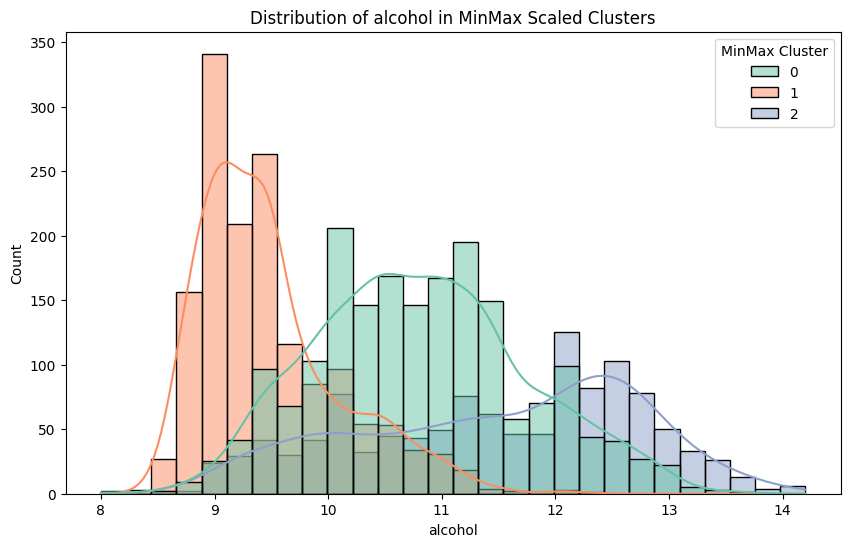

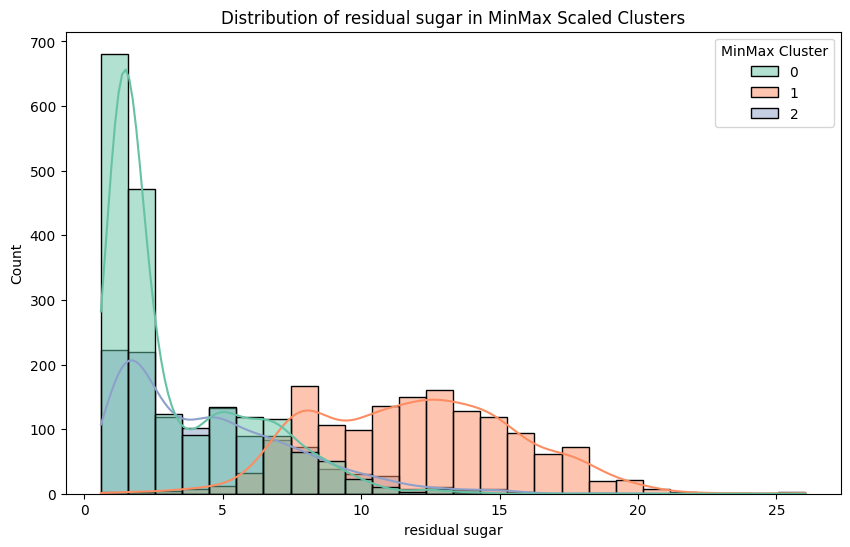

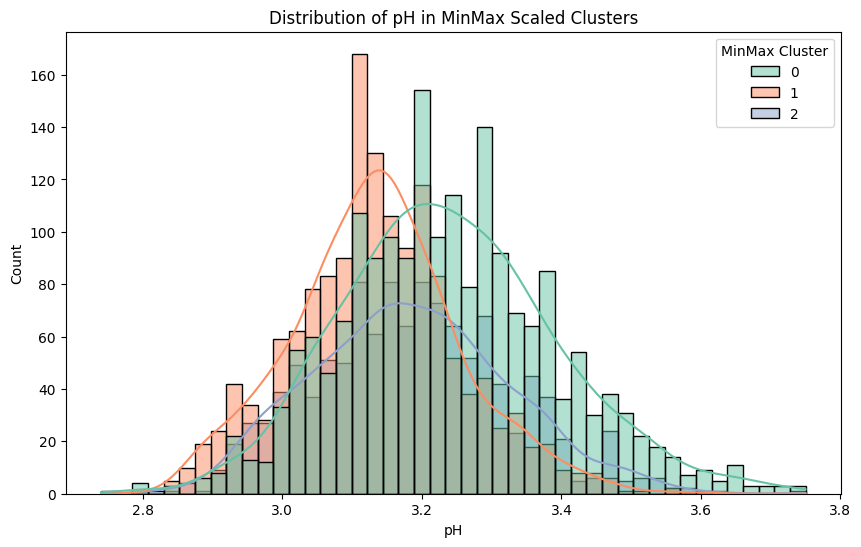

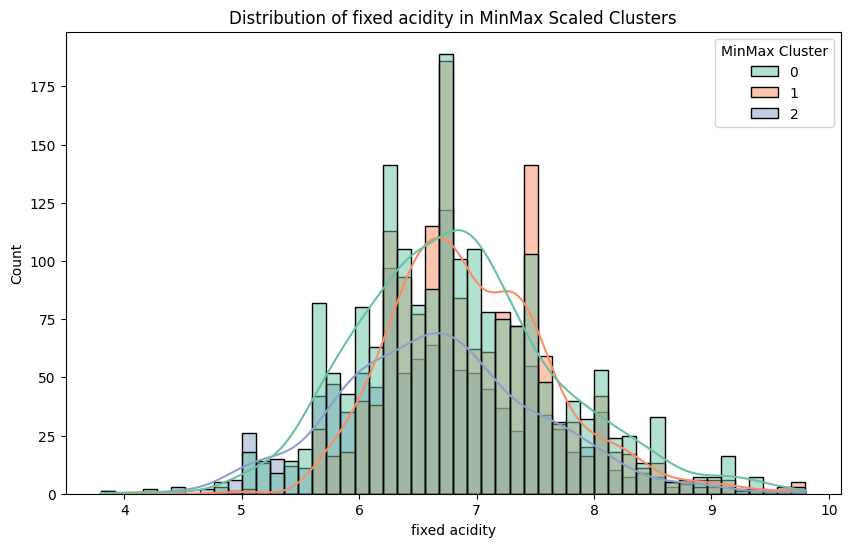

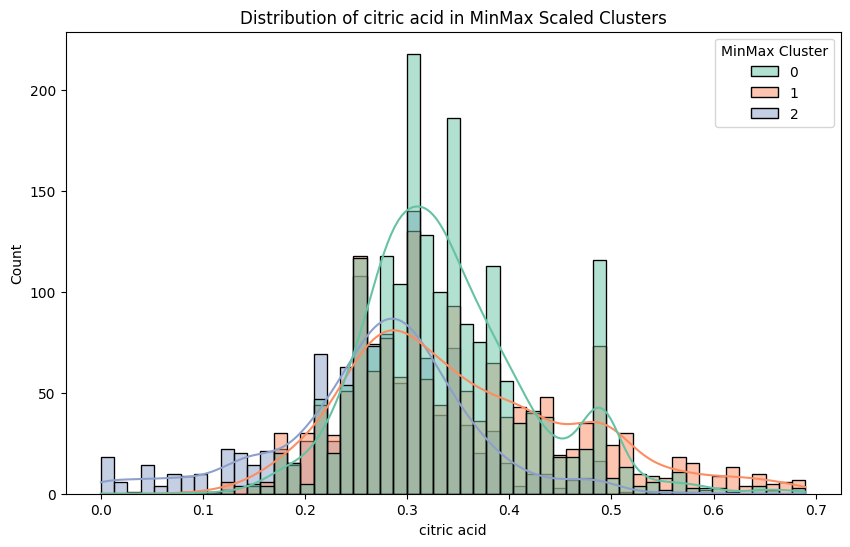

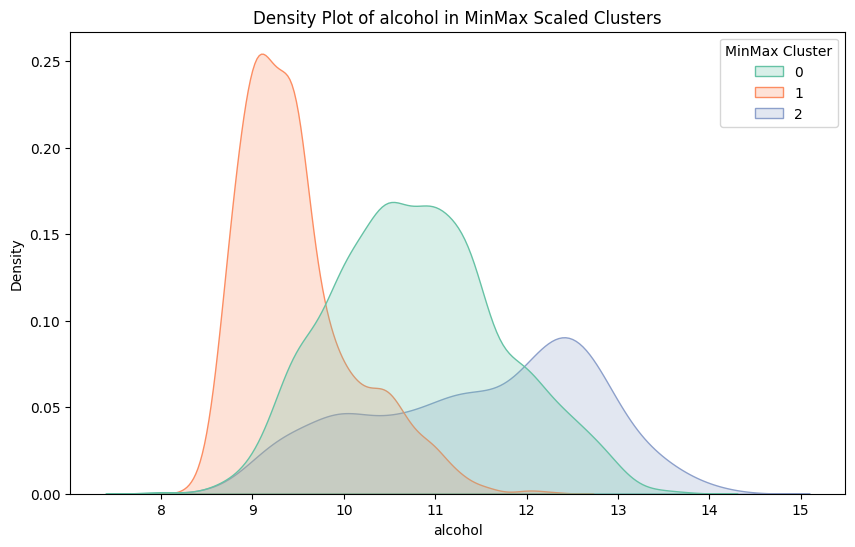

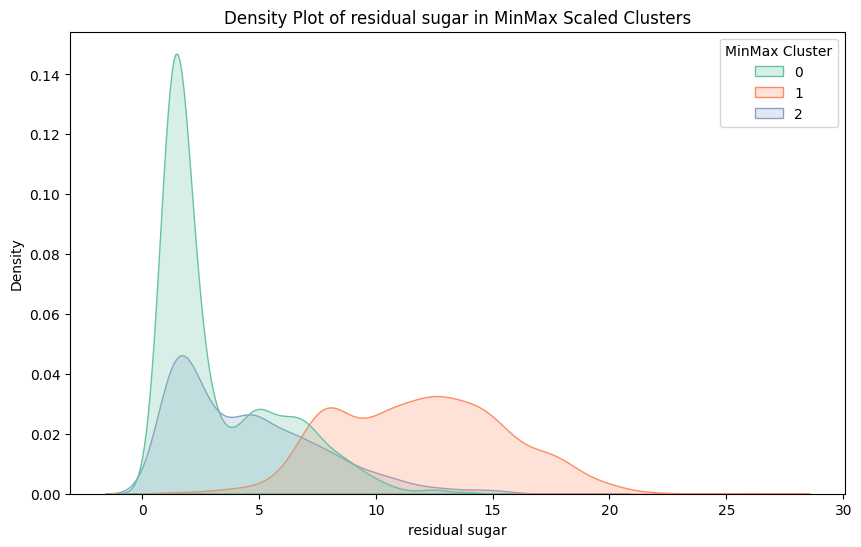

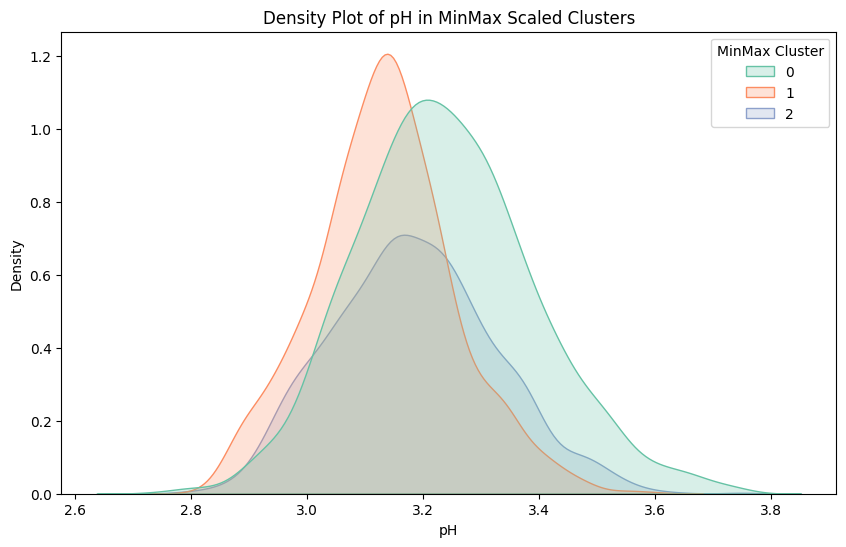

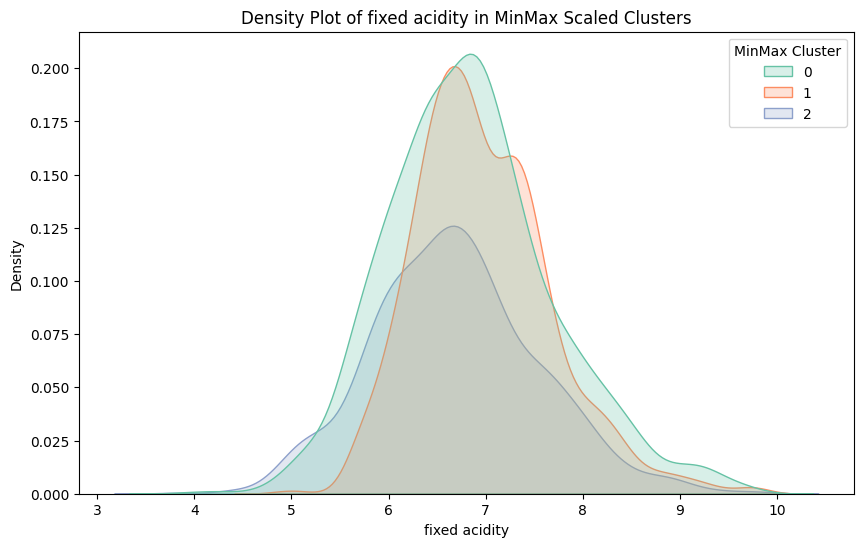

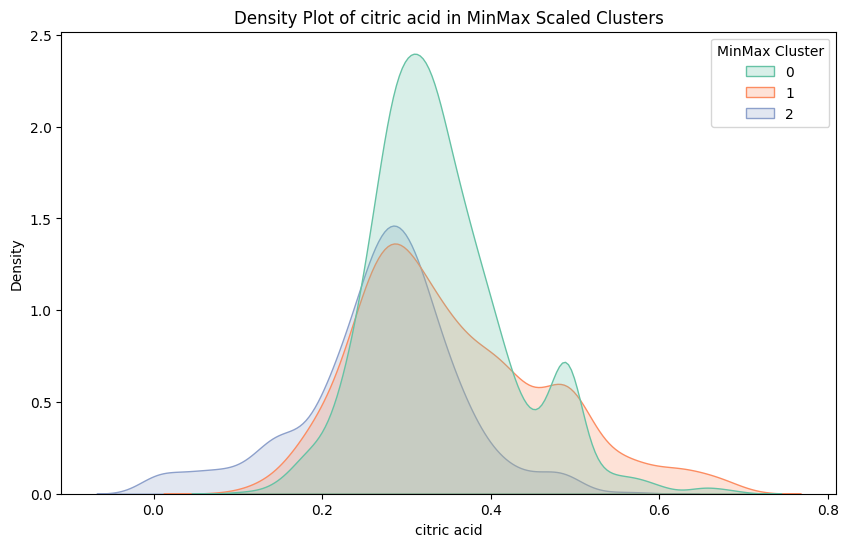

In [59]:
# List of important features to visualize
features = ['alcohol', 'residual sugar', 'pH', 'fixed acidity', 'citric acid']

# Loop through each feature and plot histograms for each cluster
for feature in features:
    plt.figure(figsize=(10, 6))
    sns.histplot(data=df_no_outliers, x=feature, hue='MinMax Cluster', kde=True, palette='Set2')
    plt.title(f'Distribution of {feature} in MinMax Scaled Clusters')
    plt.show()

# Using kdeplot for smoother density comparison
for feature in features:
    plt.figure(figsize=(10, 6))
    sns.kdeplot(data=df_no_outliers, x=feature, hue='MinMax Cluster', fill=True, palette='Set2')
    plt.title(f'Density Plot of {feature} in MinMax Scaled Clusters')
    plt.show()


MinMax scaling improved the interpretability and separation of clusters by normalizing the range of features. In particular, it helped distinguish wines with higher residual sugar more effectively, allowing us to see clearer boundaries between the clusters in both alcohol and sugar content. Additionally, scaling helped balance the influence of other variables, such as pH and fixed acidity, leading to more defined and consistent clusters.

### Alcohol Distribution in Original and MinMax-Scaled Clusters

The alcohol content distribution across the original and MinMax-scaled clusters shows distinct differences: <br>
**Cluster 0 (Original, Green):** Primarily includes wines with moderate alcohol levels (~10-11.5%), representing more balanced wines. <br>
**Cluster 1 (Original, Red):** This cluster consists of wines with higher alcohol content (~11.5-14%), likely stronger wines. <br>
**Cluster 2 (Original, Blue):** Consists of wines with lower alcohol content (~8-10%), suggesting lighter wines.<br>

After MinMax scaling: <br>
**Cluster 0 (MinMax, Green):** The alcohol levels shifted slightly, and this cluster now primarily represents wines with alcohol content between 10–12%. <br>
**Cluster 1 (MinMax, Orange):** This cluster retains wines with high alcohol content (~9-10.5%), showing a concentration of stronger wines. <br>
**Cluster 2 (MinMax, Blue):** Primarily includes wines with lower alcohol content (8–9%).

### Residual Sugar Distribution in Original and MinMax-Scaled Clusters


Residual sugar helps determine the sweetness of wines:<br>
**Cluster 0 (Original, Green):** This cluster primarily contains dry wines with low residual sugar (0-5 g/L). <br>
**Cluster 1 (Original, Red):** Similar to Cluster 0, but with a slight increase in residual sugar (~5-7 g/L). <br>
**Cluster 2 (Original, Blue):** Contains wines with significantly higher residual sugar content (10-20 g/L), indicating sweeter wines.<br>


After MinMax scaling: <br>
**Cluster 0 (MinMax, Green):** This group remains associated with dry wines (0-5 g/L residual sugar). <br>
**Cluster 1 (MinMax, Orange):** Includes wines with intermediate sweetness (~5-15 g/L). <br>
**Cluster 2 (MinMax, Blue):** Still contains sweeter wines but with a sharper boundary, indicating improved separation in sweetness profiles.

### pH Distribution in Original and MinMax-Scaled Clusters


The pH of wines provides insight into their acidity levels: <br>
**Cluster 0 (Original, Green):** Represents wines with moderate pH (3.2-3.4), suggesting a balanced acidity. <br>
**Cluster 1 (Original, Red):** Contains wines that are slightly more acidic (~3.0-3.2 pH). <br>

**Cluster 2 (Original, Blue):** Consists of wines with the lowest pH (~2.8-3.0), indicating higher acidity.

After MinMax scaling:<br>
**Cluster 0 (MinMax, Green):** Remains the least acidic group (~3.2-3.4). <br>
**Cluster 1 (MinMax, Orange):** Retains slightly higher acidity (~3.0-3.2). <br>
**Cluster 2 (MinMax, Blue):** Consists of wines with high acidity (~2.8-3.0), and the separation between clusters has become clearer.

### Fixed Acidity Distribution in Original and MinMax-Scaled Clusters

Fixed acidity contributes to the sharpness of wine flavors:<br>
**Cluster 0 (Original, Green):** Represents wines with moderate acidity (~6-7 g/L). <br>
**Cluster 1 (Original, Red):** Contains wines with slightly lower fixed acidity (~5-7 g/L). <br>
**Cluster 2 (Original, Blue):** Includes wines with the highest fixed acidity (~6-8 g/L), contributing to a sharper taste.

After MinMax scaling:<br>
**Cluster 0 (MinMax, Green):** Represents wines with moderate acidity (~6-7 g/L). <br>
**Cluster 1 (MinMax, Orange):** Contains wines with slightly lower acidity (~5-7 g/L). <br>
**Cluster 2 (MinMax, Blue):** Still contains wines with higher fixed acidity (~6-8 g/L), showing improved separation post-scaling.

### Citric Acid Distribution in Original and MinMax-Scaled Clusters

Citric acid impacts the freshness and brightness of wines:<br>
**Cluster 0 (Original, Green):** Wines with moderate levels of citric acid (~0.2-0.4 g/L). <br>
**Cluster 1 (Original, Red):** Slightly higher citric acid levels (~0.3-0.5 g/L). <br>
**Cluster 2 (Original, Blue):** Wines with the highest citric acid content (~0.4-0.6 g/L), providing a zesty flavor profile.

After MinMax scaling:<br>
**Cluster 0 (MinMax, Green):** Wines with low citric acid levels (~0.2-0.4 g/L). <br>
**Cluster 1 (MinMax, Orange):** Higher citric acid levels (~0.3-0.5 g/L). <br>
**Cluster 2 (MinMax, Blue):** Retains wines with the highest citric acid levels (~0.4-0.6 g/L), and the distinction between clusters becomes clearer.


### Final Observations

MinMax scaling has significantly improved the separation between clusters for key features like residual sugar, alcohol, and acidity levels. This enhanced separation makes it easier to identify the specific characteristics of each cluster:

**Cluster 0:** Balanced wines with moderate alcohol content, low residual sugar, and a balanced acidity profile.<br>
**Cluster 1:** Higher alcohol content, slightly sweeter wines, with a more pronounced citric acid presence and moderate acidity.<br>
**Cluster 2:** Lighter wines with lower alcohol content, high acidity, and higher sweetness levels, indicating that these wines are likely more acidic and sweeter.

The improved visualization and clearer clustering boundaries offer better insights into how the winery can categorize its wines and market them based on consumer preferences.

## Step 7 -  How the Outcome of the Clustering Analysis Can Be Used by Decision Makers

The clustering results offer the winery valuable insights into different wine groups based on key characteristics such as alcohol content, residual sugar (sweetness), acidity, and other variables. The winery can leverage these insights in several practical ways to enhance business operations, optimize marketing strategies, and guide product development. Below are three key applications for how decision-makers can use the updated clustering results.

**Targeted Marketing Campaigns**

With the clustering results, the winery can segment its customer base and design more targeted marketing campaigns to cater to specific preferences. Each cluster represents wines with distinct profiles that appeal to different types of consumers:

**Cluster 1 (MinMax):** Wines in this group have slightly higher alcohol content (9-10.5%) and moderate residual sugar. These wines likely appeal to customers who enjoy stronger, fuller-bodied wines that are not overly sweet. Marketing strategies for this cluster can focus on promoting bold, rich wines during the colder months or holiday seasons.

**Cluster 2 (MinMax):** This cluster contains lighter wines with lower alcohol content (8-9%) but higher acidity and moderate sweetness. These wines are likely favored by customers who enjoy crisp, refreshing flavors. This segment of the market can be targeted during warmer months or in regions where lighter wines are preferred. The winery can use digital marketing campaigns (social media, email) to appeal to consumers who favor lighter, more acidic wines.

**Cluster 0 (MinMax):** This cluster includes balanced wines with moderate alcohol content (10-12%) and lower sweetness. These wines are versatile and can appeal to a broad audience, making them suitable for mainstream marketing campaigns. The winery can create promotions that highlight the balanced profile of these wines and position them as a choice for a wide range of occasions.

**Product Development and Innovation**

The clustering analysis also reveals potential opportunities for product development:

**Cluster 2:** Wines with a lighter profile and higher acidity suggest a niche market for consumers who prefer refreshing, crisp wines with lower alcohol content. The winery could introduce new products in this category or innovate around similar flavor profiles to attract this segment. They might experiment with wine blends or develop a new line that emphasizes low-alcohol, high-acid wines to tap into the growing market for light wines.

**Cluster 1:** The stronger, higher-alcohol wines in this cluster suggest that some consumers may prefer bold, robust wines with moderate sweetness. This insight can guide the development of new, bolder wines, or it can help optimize the winery’s existing offerings to meet the demand for more powerful flavor profiles. The winery could explore expanding this category by experimenting with aging techniques or blending to enhance the richness of these wines.

By using these data-driven insights, the winery can optimize its wine portfolio, introduce new products that align with consumer preferences, and phase out less popular wines based on market demand.

**Inventory and Supply Chain Management**<br>
One of the most valuable applications of the clustering analysis is in optimizing inventory and supply chain management. The clearer cluster boundaries provided by the MinMax scaling allow the winery to make more informed decisions about inventory levels, production planning, and distribution based on the characteristics of each wine cluster. This is particularly relevant when considering seasonal demand patterns for different types of wine.

**Seasonal Preferences and Cluster Demand**
**Cluster 2 (Lighter Wines):** This cluster is characterized by wines with lower alcohol content, higher acidity, and a crisp, refreshing taste profile. These characteristics make Cluster 2 wines particularly appealing during warmer months or in regions where lighter, more refreshing wines are preferred. The winery can use this insight to anticipate higher demand for Cluster 2 wines during the summer season and prepare accordingly by increasing production and stock levels leading up to the warmer months. Additionally, product launches or promotions for Cluster 2 wines can be strategically timed to coincide with periods of higher demand, ensuring that the winery capitalizes on seasonal consumer preferences.

**Cluster 1 (Stronger, Fuller-Bodied Wines):** Wines in Cluster 1, with their higher alcohol content and moderate sweetness, tend to appeal more to customers during colder months or festive periods, such as the holiday season. These wines may be associated with richer meals and celebratory events, which align with seasonal preferences for bolder, more robust wines. The winery can plan its production and inventory management around these trends by ensuring that Cluster 1 wines are readily available during the fall and winter months, when demand for such wines is expected to peak.

**Cluster 0 (Balanced Wines):** Cluster 0 contains wines with moderate alcohol content and lower sweetness, making them versatile and likely to appeal to a broad customer base throughout the year. These wines are suitable for various occasions and could serve as the winery’s steady sellers. Since Cluster 0 wines can be marketed year-round, the winery can maintain consistent stock levels, adjusting only slightly for any observed seasonal variations.

**Strategic Product Launches and Stock Allocation**<br>
The improved clustering boundaries achieved through MinMax scaling also allow the winery to be more strategic about product launches and stock allocation. For instance:

**Cluster 2 wines** can be launched or promoted in conjunction with summer-themed events, wine-tasting festivals, or warm-weather holidays when lighter wines are in higher demand. The winery can allocate more stock to regions or retailers where consumer preferences lean toward lighter, more acidic wines.<br>
**Cluster 1 wines** can be promoted heavily during the holiday season or in colder regions, where the preference for stronger, fuller-bodied wines is more prominent. The winery can adjust its inventory and distribution strategy to ensure these wines are well-stocked for the holiday season, maximizing sales during peak demand.<br>


**Benefits of Better Cluster Separation**<br>
Thanks to the clearer separation of clusters following MinMax scaling, these seasonal and regional strategies can be implemented with greater precision. The winery can now confidently segment its inventory and supply chain management based on well-defined customer preferences, ensuring that the right wines are available at the right time and in the right markets.

The more distinct cluster boundaries allow for better forecasting of demand patterns, which in turn leads to reduced waste and optimized production. By aligning production with seasonal demand, the winery can prevent stockouts during peak periods while avoiding overproduction of wines that are less popular at certain times of the year.

### Conclusion

The clustering analysis has provided the winery with key insights that can be used for targeted marketing, product development, and inventory management. Understanding the characteristics of each wine cluster enables the winery to:

Tailor marketing campaigns to specific customer preferences, boosting customer engagement and sales.
Innovate and develop new products based on consumer preferences for different wine profiles, helping the winery tap into new markets.
Optimize inventory and supply chain management by forecasting demand and adjusting production levels to avoid overproduction or shortages.
These actions will help improve customer satisfaction, drive sales, and streamline business operations, ensuring that the winery can effectively meet market demands while maintaining high operational efficiency.

# Task 2 - Association Analysis

## Step 1 - Data Quality

In [65]:
# Import necessary libraries
import pandas as pd

# Load the dataset
df_bakery = pd.read_csv('D2_bakery.csv')

# Display the first few rows of the dataset to inspect
df_bakery.head()

# Check for missing values and data types
df_bakery.info()

# Check for any duplicated rows
print("Number of duplicate rows:", df_bakery.duplicated().sum())

# Check for unusual or incorrect data entries (e.g., impossible values)
df_bakery.describe(include='all')


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5707 entries, 0 to 5706
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   TransactionNo  5648 non-null   float64
 1   Items          5645 non-null   object 
 2   DateTime       5665 non-null   object 
 3   Daypart        5641 non-null   object 
 4   DayType        5644 non-null   object 
dtypes: float64(1), object(4)
memory usage: 223.1+ KB
Number of duplicate rows: 315


,TransactionNo,Items,DateTime,Daypart,DayType
count,5648.000000,5645,5665,5641,5644
unique,NaN,63,2762,3,2
top,NaN,Coffee,2016-04-11 11:42:12,Afternoon,Weekday
freq,NaN,1527,8,2949,3625
mean,1397.210340,NaN,NaN,NaN,NaN
std,815.195306,NaN,NaN,NaN,NaN
min,1.000000,NaN,NaN,NaN,NaN
25%,691.000000,NaN,NaN,NaN,NaN
50%,1374.000000,NaN,NaN,NaN,NaN
75%,2110.250000,NaN,NaN,NaN,NaN


The dataset has 5,707 entries with some missing values and duplicates:

**TransactionNo:** 5,648 non-null entries; missing values will need attention.<br>
**Items:** 63 unique products; "Coffee" is the most frequent item (1,527 occurrences). 62 missing values.<br>
**DateTime:** 2,762 unique timestamps; 42 missing values.<br>
**Daypart:** 66 missing entries; "Afternoon" is the most frequent period (2,949 transactions).<br>
**DayType:** 63 missing values; most transactions occurred on weekdays (3,625).<br>
**Duplicates:** 315 duplicate rows detected.

These issues will be addressed in the data cleaning process to ensure the dataset is ready for analysis.



In [67]:
# Remove duplicate rows
df_bakery = df_bakery.drop_duplicates()

# Handle missing values in 'Items' by dropping rows where 'Items' is NaN
df_bakery = df_bakery.dropna(subset=['Items'])

# Handle missing values in 'TransactionNo' by dropping rows where 'TransactionNo' is NaN
df_bakery = df_bakery.dropna(subset=['TransactionNo'])

# Reset the index after removing rows
df_bakery.reset_index(drop=True, inplace=True)

# Check again for any remaining missing values
df_bakery.isnull().sum()

# Now safely convert 'TransactionNo' to integer
df_bakery['TransactionNo'] = df_bakery['TransactionNo'].astype(int)
df_bakery['Items'] = df_bakery['Items'].astype(str)

# Display the cleaned dataset information
df_bakery.info()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5274 entries, 0 to 5273
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   TransactionNo  5274 non-null   int64 
 1   Items          5274 non-null   object
 2   DateTime       5235 non-null   object
 3   Daypart        5208 non-null   object
 4   DayType        5214 non-null   object
dtypes: int64(1), object(4)
memory usage: 206.1+ KB


### Data Cleaning and Handling Missing Values

In this step, we focused on cleaning the dataset to ensure that only high-quality, reliable data was used for association rule mining. Since the accuracy and usefulness of association rules depend heavily on the quality of the input data, it was critical to address any missing values or duplicated entries.

**Handling Missing Data**<br>
**Approach:** Rows with missing values in the essential columns (TransactionNo and Items) were dropped rather than imputed. This decision was made because imputing values in this context could distort the actual relationships between items purchased together. For example, guessing what item a customer may have bought introduces noise into the analysis and could generate false association rules. By removing incomplete rows, we ensure that only genuine and complete transactions are considered in the analysis.

**Impact on Association Mining:** Dropping rows with missing values ensures that each association rule generated accurately reflects genuine patterns of co-occurrence between products. Had we chosen to impute missing items, it could have led to misleading rules, which in turn could result in inaccurate insights and poor business decisions.

**Removing Duplicate Rows**<br>
**Approach:** We identified and removed 315 duplicate rows. Keeping these duplicates would have caused certain associations to be over-represented, skewing the results of the analysis. Duplicate transactions would inflate the support for certain itemsets, leading to inaccurate conclusions about which items are frequently bought together.

**Impact on Association Mining:** By eliminating duplicate rows, we ensure that the support values calculated during association mining genuinely reflect the frequency of item co-occurrences. This prevents false associations from dominating the results and provides more accurate, actionable rules.


### Business Impact of Data Quality 
Ensuring high data quality is fundamental to deriving reliable insights from association rule mining. By cleaning the dataset, we make sure that the rules generated reflect actual purchasing behavior without being distorted by missing or duplicated data. This has several benefits for decision-makers at the bakery:

**Improved Customer Segmentation:** Accurate association rules allow the bakery to understand genuine patterns in customer behavior. For example, knowing that customers who purchase coffee often buy muffins enables more targeted marketing strategies.

**More Effective Product Placement:** High-quality data ensures that the bakery can optimize product placement by knowing which products are frequently bought together. Misleading rules, on the other hand, could lead to misplaced marketing efforts or product positioning, wasting both time and resources.

**Enhanced Inventory Management:** When data is clean, the bakery can reliably forecast demand for certain items based on associations, leading to better inventory control. For example, knowing that pastries and coffee are frequently purchased together can help the bakery stock accordingly, reducing waste and avoiding stockouts.

In summary, by maintaining a high standard of data quality, we ensure that the insights derived from association mining are both accurate and actionable, providing the bakery with a strong foundation for data-driven decision-making.

## Step 2 - Variables to Include in the Analysis

In [71]:
# Keep only the relevant columns for association analysis
df_association = df_bakery[['TransactionNo', 'Items']]

# Drop any remaining rows with missing values in 'Items' or 'TransactionNo'
df_association.dropna(subset=['TransactionNo', 'Items'], inplace=True)

# Display the cleaned data for association mining
df_association.head()


/var/folders/zf/ywnws8x12yzfnnbwcyh6253m0000gn/T/ipykernel_33339/287050096.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_association.dropna(subset=['TransactionNo', 'Items'], inplace=True)


,TransactionNo,Items
0,1,Bread
1,2,Scandinavian
2,3,Hot chocolate
3,3,Jam
4,3,Cookies


In this step, we begin by selecting only the columns relevant to our association analysis, specifically TransactionNo and Items. These columns are crucial for understanding the relationships between products that are purchased together.

Next, we ensure that any remaining rows with missing values in either TransactionNo or Items are dropped, as missing values could negatively affect the accuracy of the association rule mining process.

Finally, we display the cleaned dataset to verify that it is ready for the next stage of association mining.

In [76]:
from mlxtend.preprocessing import TransactionEncoder

# Keep only the relevant columns for association analysis
df_association = df_bakery[['TransactionNo', 'Items']]

# Drop any remaining rows with missing values in 'TransactionNo' or 'Items'
df_association.dropna(subset=['TransactionNo', 'Items'], inplace=True)

# Group the dataset by TransactionNo and create a list of items purchased per transaction
transactions = df_association.groupby('TransactionNo')['Items'].apply(list).tolist()

# Use TransactionEncoder to one-hot encode the data for association rule mining
from mlxtend.preprocessing import TransactionEncoder

te = TransactionEncoder()
te_ary = te.fit(transactions).transform(transactions)
df_encoded = pd.DataFrame(te_ary, columns=te.columns_)

# Display the first few rows of the one-hot encoded dataset
df_encoded.head()


/var/folders/zf/ywnws8x12yzfnnbwcyh6253m0000gn/T/ipykernel_33339/1570290798.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_association.dropna(subset=['TransactionNo', 'Items'], inplace=True)


,Adjustment,Alfajores,Art Tray,Bacon,Bakewell,Basket,Bowl Nic Pitt,Bread,Bread Pudding,Brownie,...,Soup,Spread,Tartine,Tea,The BART,The Nomad,Tiffin,Toast,Truffles,Victorian Sponge
0,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False


## Step 3 - Association Mining Using Apriori

In [78]:
from mlxtend.frequent_patterns import apriori, association_rules

# Use the apriori algorithm to find frequent itemsets with a minimum support threshold
frequent_itemsets = apriori(df_encoded, min_support=0.01, use_colnames=True)

# Display the top 5 frequent itemsets
frequent_itemsets.head()

# Generate the association rules with a minimum confidence threshold
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.2)

# Display the top 5 rules
rules.head()


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(Alfajores),(Bread),0.053877,0.316345,0.012013,0.222973,0.704841,-0.005031,0.879834,-0.306810
1,(Alfajores),(Coffee),0.053877,0.472151,0.028395,0.527027,1.116225,0.002957,1.116023,0.110052
2,(Brownie),(Bread),0.054969,0.316345,0.012377,0.225166,0.711772,-0.005012,0.882324,-0.299964
3,(Bread),(Coffee),0.316345,0.472151,0.083728,0.264672,0.560566,-0.065635,0.717841,-0.534157
4,(Cookies),(Bread),0.041864,0.316345,0.012013,0.286957,0.907100,-0.001230,0.958784,-0.096568


In this step, we are applying the Apriori algorithm to the one-hot encoded dataset to identify frequent itemsets. The Apriori algorithm helps us find itemsets (combinations of items) that occur together frequently in the transactions.

Apriori Algorithm: We used the apriori function from the mlxtend library with a minimum support threshold of 1% (min_support=0.01). This means that only itemsets appearing in at least 1% of transactions will be considered. Support is a measure of how frequently an itemset appears in the dataset.

Association Rules: After identifying the frequent itemsets, we generated association rules using the association_rules function. We set the metric to "confidence" and the minimum threshold to 20% (min_threshold=0.2), meaning only rules with at least 20% confidence will be considered. Confidence measures how often the rule has been found to be true.

In [79]:
# Find the rule with the highest lift
max_lift_rule = rules.loc[rules['lift'].idxmax()]
max_lift_rule


antecedents             (Cake)
consequents              (Tea)
antecedent support    0.059701
consequent support    0.140881
support               0.016382
confidence             0.27439
lift                  1.947674
leverage              0.007971
conviction            1.183996
zhangs_metric          0.51746
Name: 10, dtype: object

### Finding the Rule with the Highest Lift

In this section, we identified the rule with the highest **lift** value. The rule is as follows:

- **Antecedent (If):** Cake
- **Consequent (Then):** Tea
- **Lift:** 1.95

The lift value of 1.95 indicates that customers who purchase *Cake* are almost twice as likely to also purchase *Tea* compared to if they were purchasing these items independently. A lift value greater than 1 shows a strong positive relationship between these two products.

- **Confidence:** 0.27 — This means that 27% of the time, when *Cake* is purchased, *Tea* is also purchased.
- **Leverage:** 0.007971 — A positive leverage indicates that the co-occurrence of these items is higher than what we would expect if the items were purchased independently.
- **Conviction:** 1.18 — The conviction value suggests that this rule is meaningful and will rarely be contradicted.

This information can guide product placement strategies. For example, the bakery may want to position *Cake* and *Tea* together in-store or create a promotional bundle to take advantage of this association.

---

In [80]:
# Find the rule with the highest confidence
max_confidence_rule = rules.loc[rules['confidence'].idxmax()]
max_confidence_rule


antecedents           (Keeping It Local)
consequents                     (Coffee)
antecedent support              0.022206
consequent support              0.472151
support                         0.017838
confidence                      0.803279
lift                            1.701316
leverage                        0.007353
conviction                       2.68323
zhangs_metric                   0.421581
Name: 16, dtype: object


Next, we identified the rule with the highest **confidence** value. The rule is as follows:

- **Antecedent (If):** Keeping It Local
- **Consequent (Then):** Coffee
- **Confidence:** 0.80

This confidence value of 80% indicates that when customers purchase *Keeping It Local*, there is an 80% chance that they will also purchase *Coffee*. A high confidence value makes this rule highly reliable for prediction.

- **Lift:** 1.70 — This suggests that customers who purchase *Keeping It Local* are 70% more likely to also purchase *Coffee* compared to random purchases.
- **Leverage:** 0.007353 — The positive leverage further confirms that *Keeping It Local* and *Coffee* are purchased together more often than by chance.
- **Conviction:** 2.68 — A high conviction score means this rule is rarely contradicted, further supporting its reliability.

This insight can be used to increase sales. The bakery might consider placing *Keeping It Local* products near *Coffee* or creating special offers to drive combined purchases.


### Applying the Findings to Business Strategies
The rules generated by the Apriori algorithm can guide several actionable business strategies:

**Cross-Promotions:**

Rules with high confidence, such as (Muffin) → (Coffee), suggest that customers who buy muffins are also highly likely to purchase coffee. This insight can be used to create cross-promotional campaigns (e.g., “Buy a muffin, get a discount on coffee”). This would incentivize customers to buy both items, increasing overall basket size.

**Product Placement:**

Based on association rules with high support, such as (Bread) → (Coffee), the bakery could strategically place bread and coffee near each other or offer them in a combo deal. Since these products are frequently bought together, improving their proximity in-store or in online displays can make it easier for customers to purchase both.

**Bundling Products:**

Rules with both high support and lift, like (Cake) → (Tea), indicate a strong correlation between the purchase of these items. The bakery could create bundle deals or limited-time offers that combine these products at a discounted price. Bundling items based on strong association rules could increase sales volume by leveraging existing customer preferences.

**Inventory and Stocking Decisions:**

Understanding which products are frequently bought together helps the bakery better manage inventory levels. For example, if Muffins and Coffee often appear together in transactions, the bakery can ensure that both are well-stocked, particularly during peak shopping times, avoiding stockouts and lost sales.


## Step 4: Visualizing Confidence, Lift, and Support

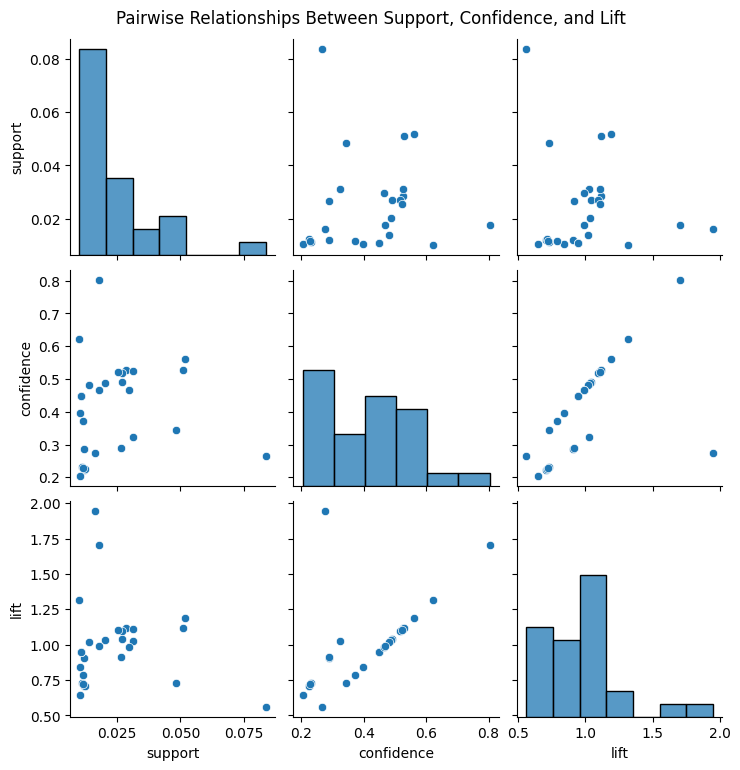

In [82]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a DataFrame with only the relevant metrics
metrics_df = rules[['support', 'confidence', 'lift']]

# Plot pairwise relationships between support, confidence, and lift
sns.pairplot(metrics_df)
plt.suptitle('Pairwise Relationships Between Support, Confidence, and Lift', y=1.02)
plt.show()


**Interpretation of Plots**<br>
In this step, we created pairwise plots to visualize the relationships between the support, confidence, and lift metrics across the association rules. These visualizations allow us to better understand how these metrics interact and identify which itemsets have the strongest associations. Here's a deeper dive into what we can infer from the visualizations:

**Support and Confidence:**

In the plot between support and confidence, we see that as support increases, confidence tends to rise as well, though the relationship is not always linear. This indicates that itemsets with higher support (i.e., frequently purchased together) often exhibit higher confidence levels, meaning customers who buy one item are more likely to buy the associated item(s).
Business Impact: This is important because rules with both high support and high confidence should be prioritized for promotions and marketing efforts. For example, if a rule has both high support and confidence, it means that many customers are already buying these items together, making them strong candidates for cross-selling or bundling strategies.

**Support and Lift:**

The plot between support and lift reveals that itemsets with lower support can still have high lift values. This is because lift measures the strength of association between two items relative to their individual purchase frequencies.
Business Impact: This suggests that even if an itemset is not frequently bought together (low support), it can still have a strong association (high lift). These high-lift itemsets are valuable for more niche, targeted promotions. For instance, rules with low support but high lift could indicate underutilized cross-sell opportunities, where customers who buy one product are much more likely to buy the other, but the overall occurrence is low. Marketing efforts could focus on increasing the visibility of these combinations to boost sales.

**Confidence and Lift:**

The plot between confidence and lift shows a positive correlation. Rules with high confidence often have high lift as well. This means that when the purchase of one item strongly predicts the purchase of another (high confidence), the association between those items is also stronger than random chance (high lift).
Business Impact: These high-confidence and high-lift rules should be the primary focus of marketing strategies. These are the itemsets that not only frequently occur together but also show a significantly strong relationship. Promoting these pairs will likely lead to a higher return on investment for the bakery.

**Correlation Discussion**
From the visualizations, we can observe several important trends:

**Positive Correlations:** There is a general positive correlation between support and confidence, as well as between confidence and lift. This means that as the co-occurrence of items increases, the likelihood that they are purchased together also increases, and the strength of their association becomes more evident. This correlation highlights which product combinations should be prioritized for strategic promotions.

**Support vs. Lift Trends:** The relationship between support and lift, however, shows that even itemsets with lower support can have high lift values, which signifies that these itemsets have stronger-than-expected associations despite being less frequent. This trend is particularly valuable when exploring niche marketing opportunities or underutilized product pairings. These itemsets can benefit from targeted promotions, especially in situations where a specific customer segment prefers these less frequent but strongly associated itemsets.



**Influence on Decision-Making**<br>
Based on the relationships between these metrics, the bakery can make more informed decisions about which itemsets to focus on for various marketing strategies:


**High Support & High Confidence:**

These rules represent items that are frequently bought together and have a strong likelihood of being purchased together when one item is already in the basket. The bakery should focus on these itemsets for cross-promotion, bundle offers, and strategic product placement.

**High Lift & Low Support:**

Itemsets with high lift but low support are prime candidates for niche promotions. Even though they don't occur frequently, when they do, there’s a stronger-than-expected association. Increasing the visibility of these product pairings can create new opportunities for sales growth.

**High Confidence & High Lift:**

These itemsets are the strongest candidates for promotions. They have both a strong predictive relationship (confidence) and an unexpectedly high co-occurrence (lift). Focusing marketing efforts on these rules can maximize the chances of increasing both customer basket size and overall revenue.

By analyzing the visualizations and understanding the relationships between support, confidence, and lift, the bakery can tailor its marketing and product placement strategies to optimize customer purchases based on data-driven insights.



## Step 5 -  Analyzing Muffin Associations

In this step, we analyze the association rules where "Muffin" appears as either an antecedent or a consequent. The goal is to identify which products customers frequently purchase alongside Muffins. This information can help the bakery make better decisions about product placement or bundling Muffins with other items to boost sales.

In [83]:
# Filter the rules where 'Muffin' is in the antecedents or consequents
muffin_rules = rules[(rules['antecedents'].astype(str).str.contains('Muffin')) | (rules['consequents'].astype(str).str.contains('Muffin'))]

# Display the filtered rules
muffin_rules


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
18,(Muffin),(Coffee),0.06407,0.472151,0.029851,0.465909,0.986779,-0.0004,0.988312,-0.014113


In this step, we filtered the association rules to find those where "Muffin" appears either in the **antecedents** or the **consequents**. This is important because we want to identify which items customers are most likely to purchase when they buy a muffin, either before or after purchasing it.

Based on the filtered results, we found one association rule that includes Muffins:

**Rule**: Muffin → Coffee<br>
**Support:** 0.029851 (around 3% of transactions included both a Muffin and Coffee)<br>
**Confidence:** 0.465909 (approximately 46.6% of the transactions that include Muffins also include Coffee)<br>
**Lift:** 0.986779 (this indicates that purchasing Coffee with Muffins is nearly as likely as purchasing Coffee randomly, so there is a slight positive association but not a very strong one)<br>
**Conviction:** 0.988312 (a measure that shows the rule's strength, close to 1 indicates a fairly weak association)<br>

This result shows that Coffee is the most associated item when customers buy Muffins. The bakery can use this insight to create bundles or place Muffins and Coffee together in promotional campaigns to encourage customers to purchase both items.

## Step 6 - Boosting Pastry Sales

In this step, we aim to identify the products that should be placed nearby Pastry in order to boost its sales. By analyzing the association rules where "Pastry" appears as an antecedent or a consequent, we can determine which products are most frequently bought alongside Pastry. This information will help the bakery optimize its product placement strategies.

In [84]:
# Filter the rules where 'Pastry' is in the antecedents or consequents
pastry_rules = rules[(rules['antecedents'].astype(str).str.contains('Pastry')) | (rules['consequents'].astype(str).str.contains('Pastry'))]

# Display the filtered rules
pastry_rules


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
6,(Pastry),(Bread),0.096469,0.316345,0.031307,0.324528,1.025868,0.000789,1.012115,0.027908
19,(Pastry),(Coffee),0.096469,0.472151,0.050965,0.528302,1.118925,0.005417,1.119039,0.117633
26,"(Coffee, Pastry)",(Bread),0.050965,0.316345,0.011649,0.228571,0.722538,-0.004473,0.886219,-0.288070
27,"(Pastry, Bread)",(Coffee),0.031307,0.472151,0.011649,0.372093,0.788080,-0.003133,0.840648,-0.217281


In this step, we filtered the association rules to find those where **Pastry** appears either in the **antecedents** or the **consequents**. This allows us to identify the products that are most frequently bought alongside **Pastry**, giving the bakery valuable insight into optimal product placement strategies or promotional bundles to boost Pastry sales.

The rules returned the following insights:

**Pastry & Bread:** There are two rules where **Pastry** is associated with **Bread** as either the **consequent** or **antecedent**. The support for these associations is approximately **3.13%** for **Pastry** and **Bread** together, with a lift of **1.03.** This indicates that the presence of **Pastry** increases the likelihood of **Bread** being bought slightly more than expected by chance, but it’s not a very strong association.

**Pastry & Coffee:** The strongest association comes from **Pastry** being associated with **Coffee.** The confidence is approximately **52.83%**, meaning when **Pastry** is purchased, there is a strong likelihood that **Coffee** will be purchased as well. The lift of **1.12** suggests that the purchase of **Pastry** increases the likelihood of **Coffee** being bought by **12%**, making **Coffee** a great candidate for product placement near **Pastry.**

**Conclusion:** Based on these rules, the bakery should consider placing **Coffee** and **Bread** near **Pastry**. Given the relatively strong association between **Pastry** and **Coffee**, cross-promotional offers or strategic placement in-store can help boost sales for both products. Additionally, **Bread**, while not as strongly associated, can still benefit from being placed near **Pastry.**



## Step 7 - Using Association Analysis for Decision-Making

The results of the association analysis offer valuable insights that can guide the bakery in making data-driven decisions across various aspects of its business, including marketing, pricing, and inventory management. Below are specific ways the bakery can leverage these insights.

#### **Strengthening Business Recommendations**

1. **Targeted Cross-Promotion Campaigns:**

**High-Confidence Rules:** The bakery can use high-confidence itemsets (e.g., "Muffin" and "Coffee") to design **cross-promotions.** For instance, customers who buy a muffin could be offered a discount on coffee, incentivizing them to add coffee to their purchase. This could be implemented as a s**easonal morning promotion** targeting breakfast customers during busy workday mornings.

**High-Lift & Low-Support Rules:** Itemsets with high lift but low support, such as "Cake" and "Tea," represent underutilized pairings that could be promoted during **niche events** like afternoon tea specials or holiday celebrations. The bakery could use these insights to introduce **limited-time combo** deals that pair cake and tea at a discounted price, aimed at drawing attention to these less common but strongly associated products.


2. **Seasonal Promotions Based on Customer Preferences:**

The bakery could time its promotions based on the analysis of seasonality and item associations. For example, during colder months, promoting itemsets like **"Pastry" and "Bread"** (identified in Step 6) could align with customer preferences for comfort food. Alternatively, during summer, products like **"Muffins" and "Iced Coffee"** could be highlighted, leveraging insights from association rules for more seasonally relevant campaigns.

3. **Dynamic Pricing Strategy:**

**Bundling Discounts:** Based on the identified frequent itemsets, the bakery can implement dynamic pricing by bundling commonly purchased items like **"Pastry" and "Bread".** Offering a discount on these itemsets as part of a bundle will encourage customers to purchase more items together, ultimately increasing the overall transaction value.

**Volume-Based Discounts:** For items with high support but lower confidence, such as "Cake" and "Tea," the bakery can introduce volume-based pricing strategies. For example, when a customer buys two cakes, they could be offered a discount on tea, driving higher sales volumes of both items.



#### **Expanding on Stock Management Recommendations**

1. **Optimizing Inventory for High-Demand Products:**

The bakery should prioritize stocking products with high support and confidence, such as **"Pastry" and "Bread".** These items are frequently purchased together, indicating strong demand. Therefore, maintaining sufficient stock of these products, especially during peak hours or busy days (e.g., weekends), is critical to avoid stockouts and missed sales opportunities.

**Seasonal Adjustments:** Inventory management can also benefit from the association rules during seasonal shifts. For example, the bakery could increase the stock of **"Muffins" and "Coffee"** during the winter season when customers might prefer warm beverages and comfort foods. Conversely, during summer, focusing on lighter products like **"Iced Coffee" and "Cookies"** could align stock levels with customer preferences.

2. **Using Low-Support Rules for Event-Based Stocking:**

Products with lower support but high lift, such as **"Cake" and "Tea,"** can be stocked more strategically during specific events or times. For example, the bakery might increase the stock of these items during events like **afternoon tea specials**, weekend brunches, or festive periods (e.g., holidays). These high-lift pairings indicate a strong customer preference when they are bought together, even though they may not be as frequent overall. By aligning stock levels with these insights, the bakery can better meet customer expectations during these events.

3. **Reducing Overstock and Wastage:**

By analyzing rules with low lift or low support, the bakery can identify products that are less likely to be bought together or that have lower demand. These insights allow the bakery to avoid overstocking items that are less frequently purchased and instead focus resources on items with higher associations. For instance, products that rarely appear together in rules with low support (e.g., "Soup" and "Pastry") can be managed more cautiously, ensuring that stock is adjusted to actual demand rather than overstocked.

4. **Preparing for High-Demand Times:**

During high-demand periods like holidays or weekends, the bakery can use the high-support rules to anticipate demand spikes and adjust stock levels accordingly. For example, **"Pastry" and "Bread"** could be overstocked ahead of time, ensuring that the bakery is well-prepared for increased demand during these peak periods. Similarly, products like "Muffins" and "Coffee" can be prioritized in inventory planning during the winter holiday season when these items are likely to be more popular.

### Conclusion

By leveraging the association rules generated through this analysis, the bakery can make more informed decisions across its operations:

**Marketing Campaigns:** Cross-promotions and bundle offers can be optimized based on high-confidence and high-lift rules, ensuring that promotions resonate with customer preferences and increase sales.

**Pricing Strategy:** Dynamic pricing, such as volume discounts and combo deals, can be implemented based on frequent itemsets, driving both customer satisfaction and higher revenue.

**Stock Management:** Inventory levels can be strategically managed based on demand patterns, ensuring that popular items are well-stocked while avoiding overstocking less popular items. Seasonal adjustments and event-specific stocking can further optimize the bakery's operations, reducing waste and maximizing profit during peak times.

With these actionable strategies, the bakery is positioned to enhance its sales, customer satisfaction, and operational efficiency by fully leveraging the insights from association rule mining.